# Import Libraries

In [6]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import seaborn as sns
import os
import cv2
from PIL import Image
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision.transforms import v2
import torchvision
import copy
from tqdm import tqdm
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from sklearn.model_selection import train_test_split
from torchvision import tv_tensors

# Dataset Overview

In [7]:
def plot_images(img_files, label_files):
    for idx in range(10):
        img_file = img_files[idx]
        img = cv2.imread(img_file)
        
        
        img_h, img_w = img.shape[0], img.shape[1]
        label_file = label_files[idx]
        with open(label_file, 'r') as f:
            lines = f.readlines()
            for line in lines:
                bbox = line.strip().split(' ')
                
                x_center = float(bbox[1]) * img_w
                y_center = float(bbox[2]) * img_h
                w = float(bbox[3]) * img_w
                h = float(bbox[4]) * img_h
                
                x_min = int(x_center - w / 2)
                y_min = int(y_center - h / 2)
                x_max = int(x_center + w / 2)
                y_max = int(y_center + h / 2)
                
                cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=(0, 255, 0), thickness=10)

        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.imshow(img)
        plt.axis('off')
        plt.show()
        

In [34]:
def classify(file_path):
    img_files = []
    label_files = []
    for file in os.listdir(file_path):
        if file.split('.')[-1] == 'jpeg' or file.split('.')[-1] == 'jpg':
            img_files.append(os.path.join(file_path,file))
        elif file != 'count.txt':
            label_files.append(os.path.join(file_path,file))
    return sorted(img_files), sorted(label_files)

## Visual Images

In [4]:
visual_file_path = '/kaggle/input/mydataset1/210417_MtErie_Enterprise_VIS_0003'
VIS_img_files, VIS_label_files= classify(visual_file_path)

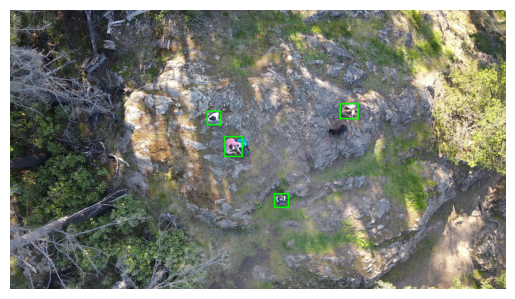

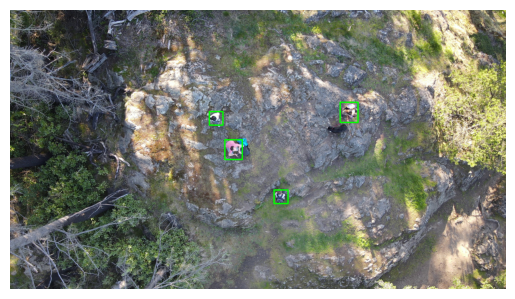

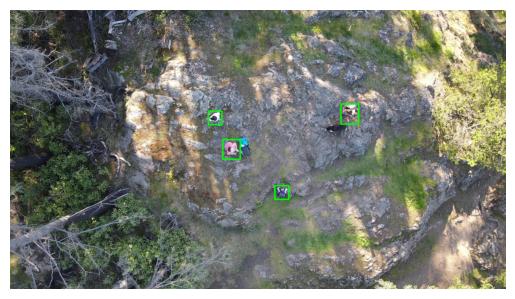

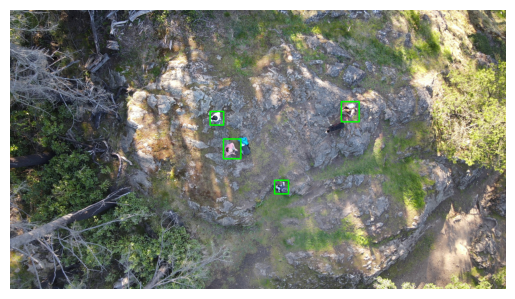

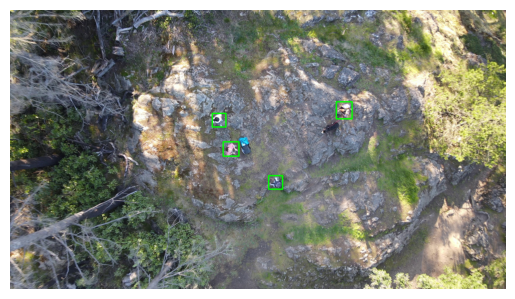

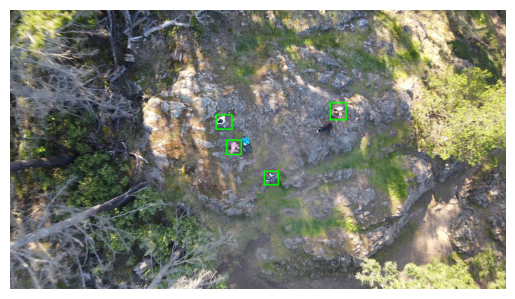

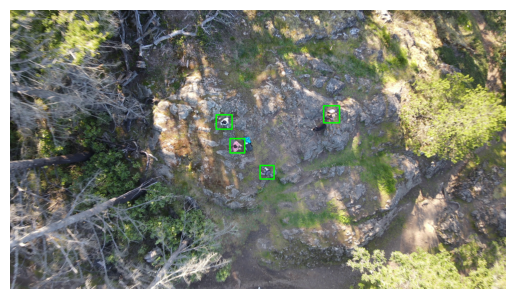

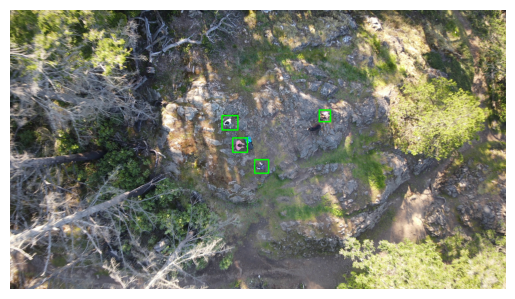

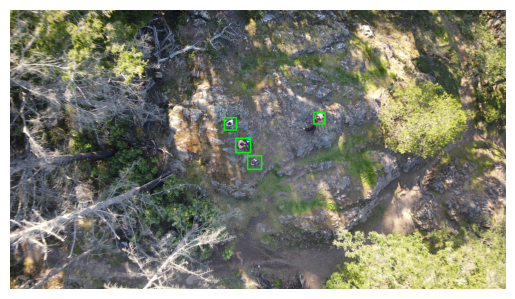

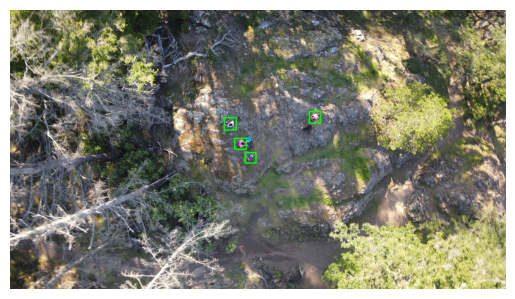

In [5]:
plot_images(VIS_img_files, VIS_label_files)

## Thermal Images

In [6]:
thermal_file_path = '/kaggle/input/mydataset/210417_MtErie_Enterprise_IR_0004'
IR_img_files, IR_label_files= classify(thermal_file_path)

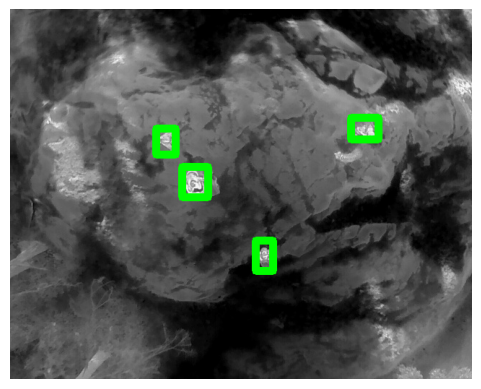

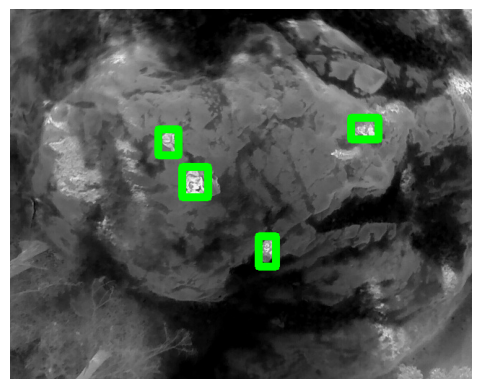

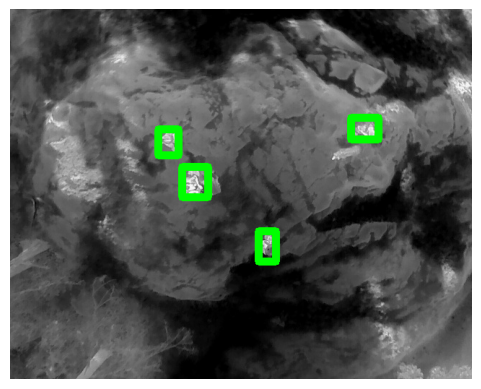

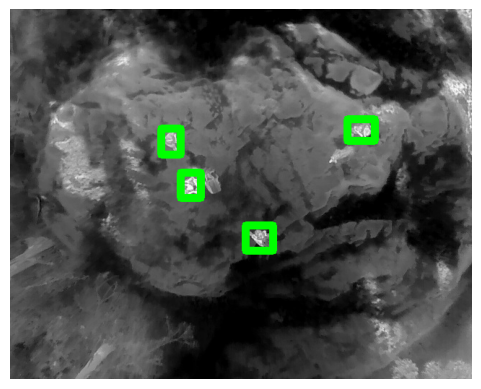

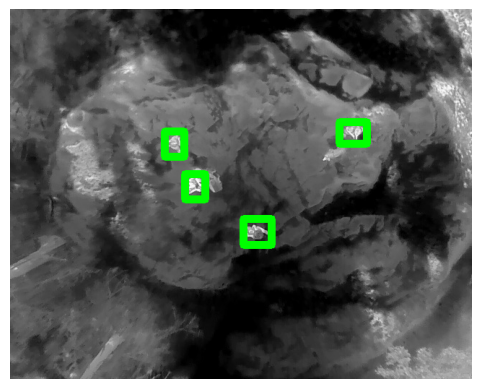

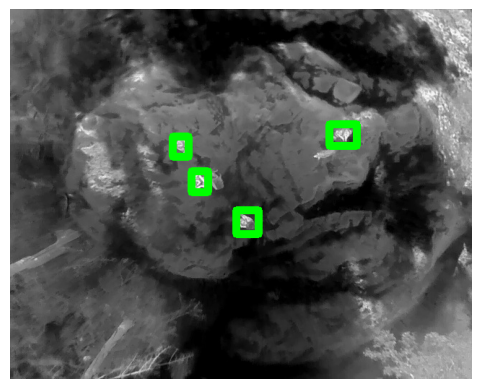

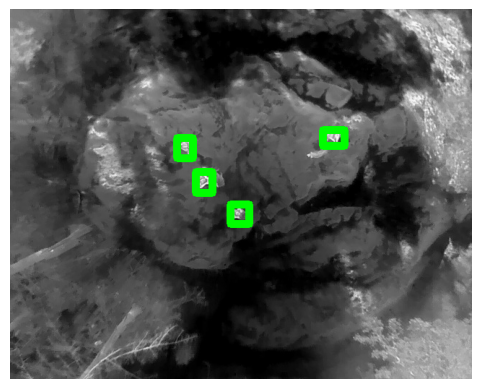

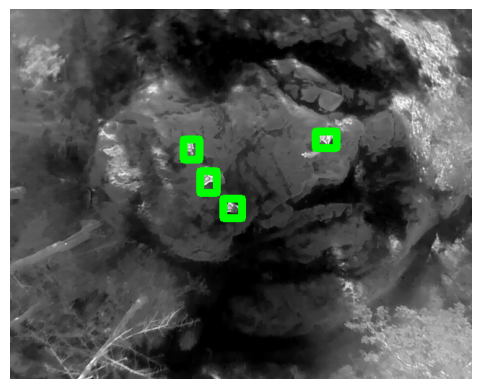

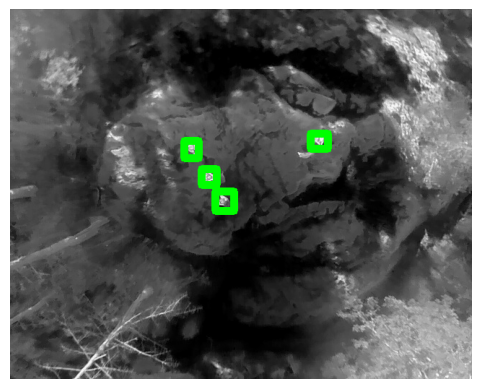

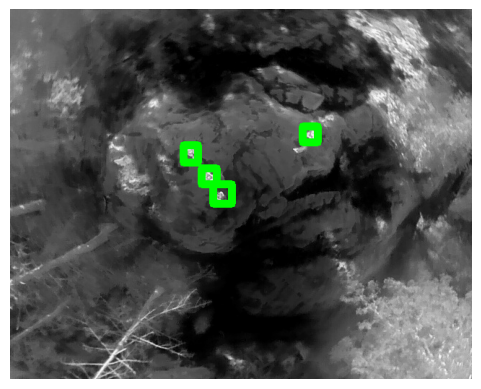

In [7]:
plot_images(IR_img_files, IR_label_files)

# Preprocessing

In [8]:
def standardization(img):
    pass

In [9]:
def augment_and_transform(img):
    pass

In [10]:
def filtering_and_smoothing(img):
    pass    

In [8]:
transform = {
    'train_crop': v2.Compose([
        v2.ToImage(),                                # Convert PIL to tensor
        v2.Resize((600, 600), antialias=True),       # Resize with antialiasing
        v2.RandomHorizontalFlip(p=0.5),              # More common to use p=0.5
        v2.ColorJitter(brightness=0.3, contrast=0.2,saturation =0.3),
        v2.RandomVerticalFlip(p=0.5),
        # v2.RandomRotation(degrees=(-90, 90)),        # Rotates both image and boxes
        v2.ToDtype(torch.float32, scale=True),       # Convert to float and scale to [0,1]
    ]),
    'test': v2.Compose([
        v2.ToImage(),
        # v2.RandomCrop((224,224)),
        v2.Resize((600, 600), antialias=True),
        v2.ToDtype(torch.float32, scale=True),
    ]),
    'val': v2.Compose([
        v2.ToImage(),
        # v2.RandomCrop((224,224)),
        v2.Resize((600, 600), antialias=True),
        v2.ToDtype(torch.float32, scale=True),
    ]),
}


In [9]:
class Dataset(Dataset):
    def __init__(self, img_files, label_files, transform=None):
        self.img_files = img_files
        self.label_files= label_files
        self.transform= transform
        
    def __len__(self):
        return len(self.img_files)

    
    def __getitem__(self, idx):
        img_file = self.img_files[idx]
        label_file = self.label_files[idx]
        
        img = Image.open(img_file).convert("RGB")
        img_w, img_h= img.size
        
        
        bboxes = self.extract_bbox(label_file, img_h,img_w)
        bboxes = bboxes if bboxes else np.reshape(bboxes,(0,4))
        bboxes= tv_tensors.BoundingBoxes(bboxes,format="XYXY", canvas_size=(img_h,img_w))
        
        labels = torch.ones(bboxes.shape[0], dtype=torch.int64)
        target = {"boxes": bboxes, "labels": labels}
    
        if self.transform:
            img, target = self.transform(img, target)
            
        
        return img, target
        
    def extract_bbox(self, label_file, img_h,img_w):
        bboxes=[]
        with open(label_file,'r') as f:
            lines= f.readlines()
            for line in lines:
                bbox = line.split(' ')
                x_center = float(bbox[1]) * img_w
                y_center = float(bbox[2]) * img_h
                w = float(bbox[3]) * img_w
                h = float(bbox[4]) * img_h
                
                x_min = int(x_center - w / 2)
                y_min = int(y_center - h / 2)
                x_max = int(x_center + w / 2)
                y_max = int(y_center + h / 2)
                bboxes.append([x_min,y_min,x_max,y_max])
        
        return bboxes
        
    
                

In [ ]:
img_files = VIS_img_files + IR_img_files
labels =  VIS_label_files + IR_label_files

In [14]:
img_files_train, img_files_val, labels_train, labels_val = train_test_split(
    img_files, labels, test_size=0.3, random_state=42, shuffle=True
)

In [15]:
train_ds = Dataset(img_files_train, labels_train, transform['train_crop'])
val_ds = Dataset(img_files_val, labels_val, transform['val'])

## Check Dataset

In [11]:
def check(dataset, n_samples):
    for i in range(n_samples):
        img, target= dataset[i]
        boxes = target['boxes']
        boxes=boxes.detach().numpy().astype(np.int32)
        sample=img.permute(1,2,0).numpy().copy()
        for box in boxes:
            sample=cv2.rectangle(sample,(box[0], box[1]),(box[2], box[3]),(220, 0, 0), 3)
        plt.imshow(sample)
        plt.axis('off')
        plt.show()
        
        
        

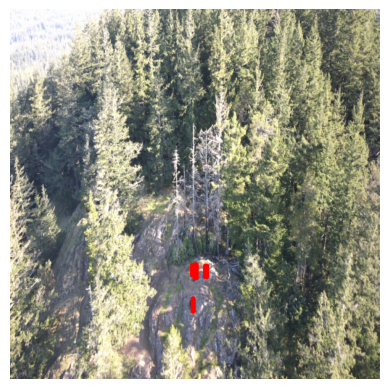

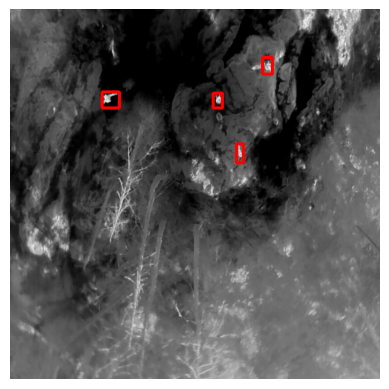

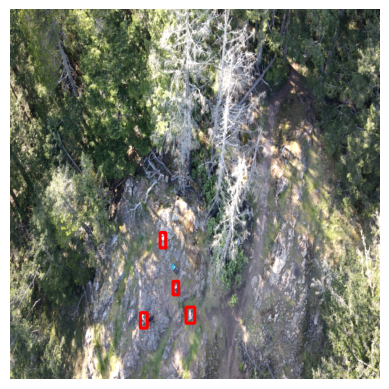

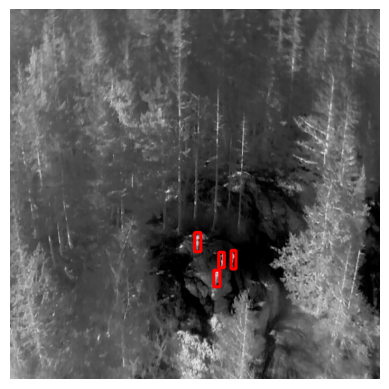

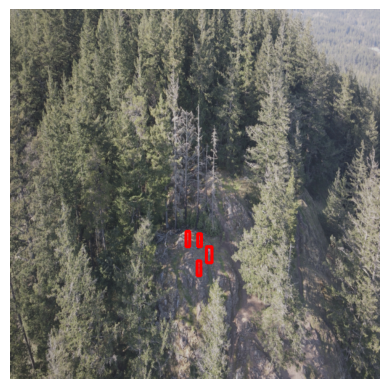

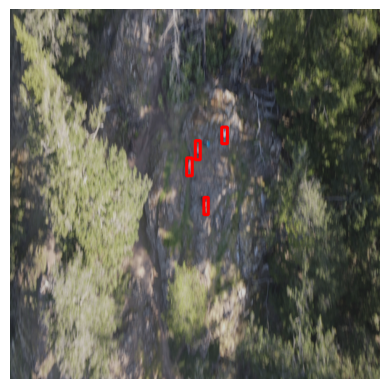

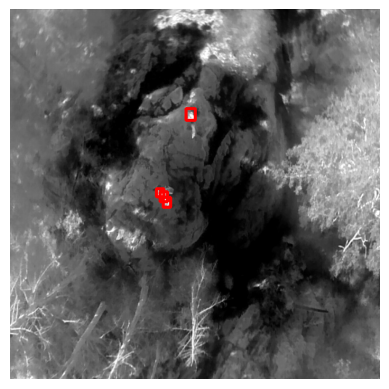

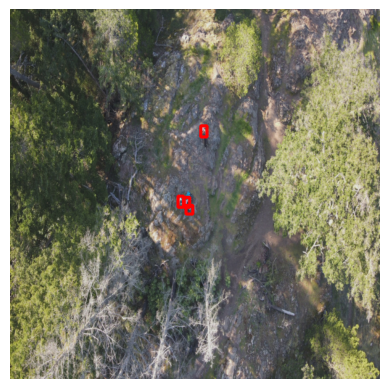

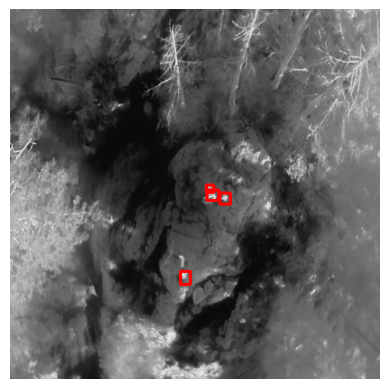

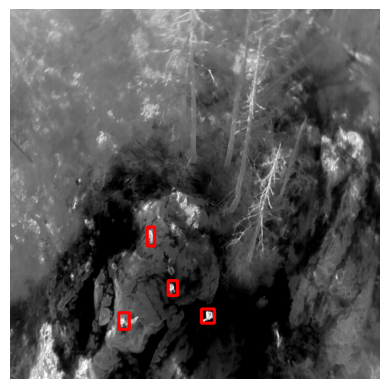

In [17]:
check(train_ds, 10)

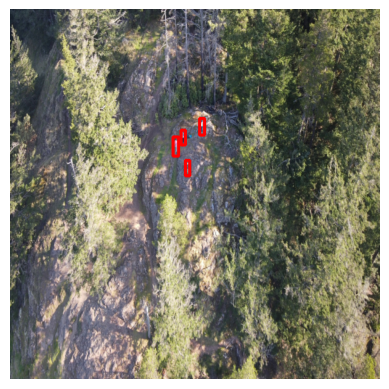

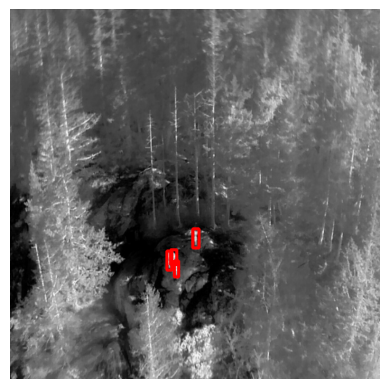

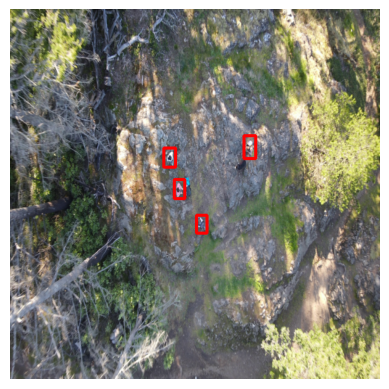

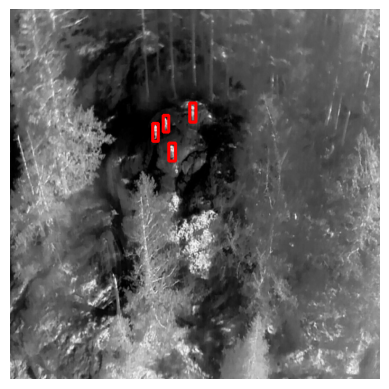

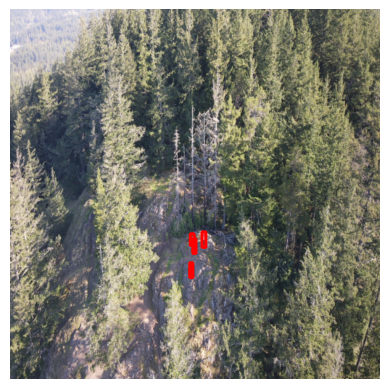

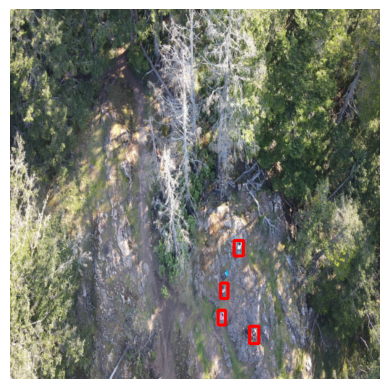

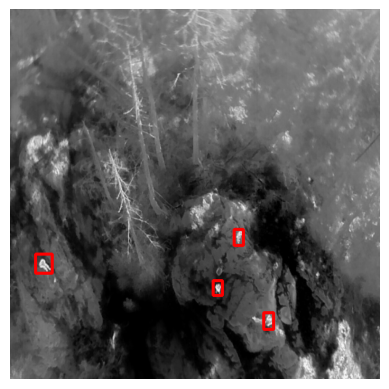

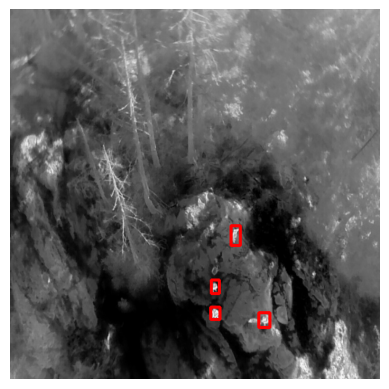

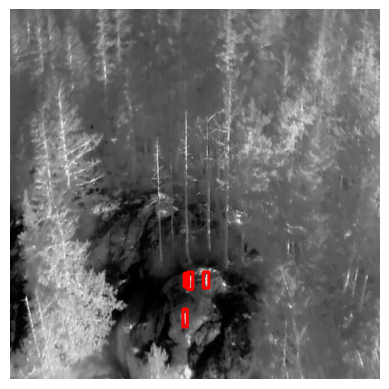

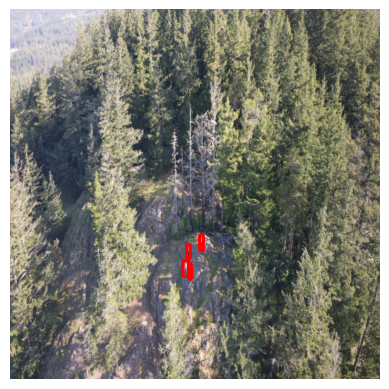

In [18]:
check(val_ds, 10)

# Dataloader

In [12]:
def collate_fn(batch):
    return tuple(zip(*batch))

In [ ]:
train_loader = DataLoader(train_ds, batch_size=32, shuffle=True,collate_fn=collate_fn)
val_loader = DataLoader(val_ds, batch_size=32, shuffle=False, collate_fn=collate_fn)

# Modeling

In [14]:
model= torchvision.models.detection.fasterrcnn_resnet50_fpn(weights=torchvision.models.detection.FasterRCNN_ResNet50_FPN_Weights.DEFAULT)
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, 2)

In [15]:
model.backbone.requires_grad_(False)

BackboneWithFPN(
  (body): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): FrozenBatchNorm2d(64, eps=0.0)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): FrozenBatchNorm2d(64, eps=0.0)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): FrozenBatchNorm2d(64, eps=0.0)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): FrozenBatchNorm2d(256, eps=0.0)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): FrozenBatchNorm2d(256, eps=0.0)
        )
      )
      (1): Bottleneck(
        (conv1): C

In [23]:
for name, param in model.named_parameters():
    print(name,param.requires_grad)

backbone.body.conv1.weight False
backbone.body.layer1.0.conv1.weight False
backbone.body.layer1.0.conv2.weight False
backbone.body.layer1.0.conv3.weight False
backbone.body.layer1.0.downsample.0.weight False
backbone.body.layer1.1.conv1.weight False
backbone.body.layer1.1.conv2.weight False
backbone.body.layer1.1.conv3.weight False
backbone.body.layer1.2.conv1.weight False
backbone.body.layer1.2.conv2.weight False
backbone.body.layer1.2.conv3.weight False
backbone.body.layer2.0.conv1.weight False
backbone.body.layer2.0.conv2.weight False
backbone.body.layer2.0.conv3.weight False
backbone.body.layer2.0.downsample.0.weight False
backbone.body.layer2.1.conv1.weight False
backbone.body.layer2.1.conv2.weight False
backbone.body.layer2.1.conv3.weight False
backbone.body.layer2.2.conv1.weight False
backbone.body.layer2.2.conv2.weight False
backbone.body.layer2.2.conv3.weight False
backbone.body.layer2.3.conv1.weight False
backbone.body.layer2.3.conv2.weight False
backbone.body.layer2.3.conv3.

In [24]:
model

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [16]:
device= 'cuda'
optimizer = torch.optim.Adam(model.parameters(), lr = 1e-5,  weight_decay=0.1)
lr_scheduler=torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, 
                                                  patience=8, threshold=0.0001)
model.to(device)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [26]:
def get_lr(optimizer):
    for params in optimizer.param_groups:
        return params["lr"]

In [27]:
best_validation_loss=np.inf
best_weights=copy.deepcopy(model.state_dict())

In [28]:
def eval(model, val_loader, device, current_lr, lr_scheduler):
    total_loss=[]
    global best_validation_loss, best_weights
    with torch.no_grad():
        for imgs, targets in val_loader:
            imgs = list(img.to(device) for img in imgs)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            
            loss_dict = model(imgs, targets)
            loss = sum( loss for loss in loss_dict.values())
            total_loss.append(loss)
    avg_loss=sum(total_loss)/len(total_loss)
    lr_scheduler.step(avg_loss)
    if current_lr!=get_lr(optimizer):
        print("Loading best model weights")
        model.load_state_dict(best_weights)
    
    if sum(total_loss)<best_validation_loss:
        print("Loading best model weights")
        best_validation_loss=sum(total_loss)
        best_weights=copy.deepcopy(model.state_dict())
    
    return avg_loss
     
        
        
        

In [29]:
def train(model, train_loader, val_loader, optimizer, lr_scheduler, epochs, device):
    total_training_loss= []
    total_valid_loss=[]
    model.train()
    
    for epoch in range(epochs):
        epoch_loss=[]
        current_lr=get_lr(optimizer)
        for imgs, targets in train_loader:
            optimizer.zero_grad()
            imgs = list(img.to(device) for img in imgs)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            
            loss_dict = model(imgs, targets)
            losses=sum(loss for loss in loss_dict.values())
            epoch_loss.append(losses.item())
            losses.backward()    
            optimizer.step()
        epoch_loss=sum(epoch_loss)/len(epoch_loss)  
        total_training_loss.append(epoch_loss)
        
        val_loss= eval(model, val_loader, device, current_lr, lr_scheduler)
        total_valid_loss.append(val_loss)
        print(f"Epoch {epoch+1} \nTraining Loss: {epoch_loss} \nValidation Loss: {val_loss}")
        print("*"*50)
    
    print(f"Average Training: {sum(total_training_loss)/len(total_training_loss)}")
    print(f"Average Validation: {sum(total_valid_loss)/len(total_valid_loss)}")

        
            
    

In [30]:
train(model,train_loader, val_loader, optimizer, lr_scheduler, 10, device)


Loading best model weights
Epoch 1 
Training Loss: 1.231625884771347 
Validation Loss: 1.073014259338379
**************************************************
Loading best model weights
Epoch 2 
Training Loss: 0.9915425330400467 
Validation Loss: 0.910372257232666
**************************************************
Loading best model weights
Epoch 3 
Training Loss: 0.8508152663707733 
Validation Loss: 0.7603211998939514
**************************************************
Loading best model weights
Epoch 4 
Training Loss: 0.697070891658465 
Validation Loss: 0.6201569437980652
**************************************************
Loading best model weights
Epoch 5 
Training Loss: 0.5483343253533045 
Validation Loss: 0.49540677666664124
**************************************************
Loading best model weights
Epoch 6 
Training Loss: 0.4440448383490245 
Validation Loss: 0.40266725420951843
**************************************************
Loading best model weights
Epoch 7 
Training Loss: 0.3

# Save Weights

In [31]:
torch.save(best_weights,"rcnn_pretrained.pth")

# Implementation

In [17]:
best_weights_file= '/kaggle/working/rcnn_pretrained.pth'
model.load_state_dict(torch.load(best_weights_file))

<ipython-input-17-665470deecf4>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_weights_file))


<All keys matched successfully>

In [18]:
img_path="/kaggle/input/test-dataset/200505_Bellingham_Mavic_Mini_VIS_0015"
img_files = [os.path.join(img_path,img_file) for img_file in os.listdir(img_path)]


In [19]:
def show(img,boxes,ax,color=(255,0,0)):
    
    boxes=boxes.detach().cpu().numpy().astype(np.int32)
    sample=img.permute(1,2,0).numpy().copy()
    
    for box in boxes:
        sample = cv2.rectangle(sample,(box[0], box[1]),(box[2], box[3]),color, 3)
    
    ax.axis("off");
    ax.imshow(sample);

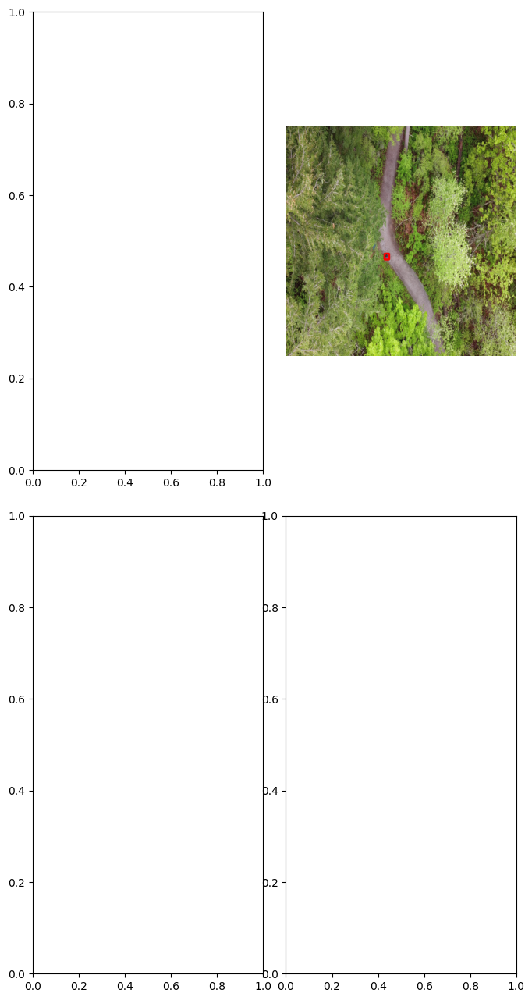

In [22]:
fig,axes=plt.subplots(2,2,figsize=(8,16))
plt.subplots_adjust(wspace=0.1,hspace=0.1)
model.eval()
img_files = ['/kaggle/input/test-dataset/200505_Bellingham_Mavic_Mini_VIS_0015/200505_Bellingham_Mavic_Mini_VIS_0015_00000000.jpg','/kaggle/input/test-dataset/200505_Bellingham_Mavic_Mini_VIS_0015/200505_Bellingham_Mavic_Mini_VIS_0015_00000001.jpg']
for img_file in img_files:
    
    img = Image.open(img_file).convert("RGB")
    img = transform['test'](img).to(device)
    predictions=model(img.unsqueeze(0))
    
    #non-max suppression
    #threshold=0.5
    #iou_threshold=0.8
    """Non-max suppression is the final step of these object detection algorithms and is 
       used to select the most appropriate bounding box for the object.
       The NMS takes two things into account
        -The objectiveness score is given by the model
        -The overlap or IOU of the bounding boxes"""
    predictions=predictions[0]
    pp_boxes=predictions["boxes"][predictions["scores"]>=0.4]
    scores=predictions["scores"][predictions["scores"]>=0.4]
    nms=torchvision.ops.nms(pp_boxes,scores,iou_threshold=0.1)
    pp_boxes=pp_boxes[nms]
    
    show(img.to('cpu'),pp_boxes.to('cpu'),axes[0,1]);
    

In [35]:
test_path='/kaggle/input/test-dataset/200505_Bellingham_Mavic_Mini_VIS_0015'
img_files, label_files= classify(test_path)
test_ds = Dataset(img_files, label_files, transform['test'])
test_loader = DataLoader(test_ds, batch_size=32, shuffle=False,collate_fn=collate_fn)

In [63]:
model.eval()
target_images=[]
for images, targets in test_loader:
    images = list(img.to(device) for img in images)
    predictions = model(images)
    
    for idx, prediction in enumerate(predictions):
        pp_boxes = prediction['boxes'][prediction['scores']>=0.4]
        scores=prediction["scores"][prediction["scores"]>=0.4]
        nms=torchvision.ops.nms(pp_boxes,scores,iou_threshold=0.1)
        pp_boxes=pp_boxes[nms]
        
        boxes=pp_boxes.to('cpu').detach().cpu().numpy().astype(np.int32)
        sample=images[idx].to('cpu').permute(1,2,0).numpy().copy()    
        sample = (sample * 255).clip(0, 255).astype(np.uint8)
        for box in boxes:
            sample = cv2.rectangle(sample,(box[0], box[1]),(box[2], box[3]),(255,0,0), 3) 

        target = targets[idx]
        boxes = target['boxes'].detach().cpu().numpy().astype(np.int32)
        for box in boxes:
            sample = cv2.rectangle(sample,(box[0], box[1]),(box[2], box[3]),(0,255,0), 3)
        sample = cv2.cvtColor(sample, cv2.COLOR_RGB2BGR)
        target_images.append(sample)
    
        
            
video_name = '/kaggle/working/VIS_video.avi'
video = cv2.VideoWriter(video_name, 0, 60, (600,600))

for image in target_images:
    video.write(image)

video.release()
cv2.destroyAllWindows()
print(f"✅ Video saved as {video_name}")

✅ Video saved as /kaggle/working/video.avi


In [ ]:
test_path='/kaggle/input/ir-test-dataset/220109_Baker_Enterprise_IR_2'
img_files, label_files= classify(test_path)
test_ds = Dataset(img_files, label_files, transform['test'])
test_loader = DataLoader(test_ds, batch_size=32, shuffle=False,collate_fn=collate_fn)

In [ ]:
model.eval()
target_images=[]
for images, targets in test_loader:
    images = list(img.to(device) for img in images)
    predictions = model(images)
    
    for idx, prediction in enumerate(predictions):
        pp_boxes = prediction['boxes'][prediction['scores']>=0.4]
        scores=prediction["scores"][prediction["scores"]>=0.4]
        nms=torchvision.ops.nms(pp_boxes,scores,iou_threshold=0.1)
        pp_boxes=pp_boxes[nms]
        
        boxes=pp_boxes.to('cpu').detach().cpu().numpy().astype(np.int32)
        sample=images[idx].to('cpu').permute(1,2,0).numpy().copy()    
        sample = (sample * 255).clip(0, 255).astype(np.uint8)
        for box in boxes:
            sample = cv2.rectangle(sample,(box[0], box[1]),(box[2], box[3]),(255,0,0), 3) 

        target = targets[idx]
        boxes = target['boxes'].detach().cpu().numpy().astype(np.int32)
        for box in boxes:
            sample = cv2.rectangle(sample,(box[0], box[1]),(box[2], box[3]),(0,255,0), 3)
        sample = cv2.cvtColor(sample, cv2.COLOR_RGB2BGR)
        target_images.append(sample)
    
        
            
video_name = '/kaggle/working/IR_video.avi'
video = cv2.VideoWriter(video_name, 0, 60, (600,600))

for image in target_images:
    video.write(image)

video.release()
cv2.destroyAllWindows()
print(f"✅ Video saved as {video_name}")